# 2022. 04. 07.

In [1]:
from mcbj import *
from tqdm.notebook import tqdm
import filter_traces
import plots
import pandas as pd

date = "22_04_07"
sample_rate = 50_000
home_folder = Path(f"D:/BJ_Data/{date}")
import numpy as np
from matplotlib.ticker import MultipleLocator

# import warnings
# warnings.filterwarnings('ignore')

# Summary

## Clean measurements

Measurement to test the new gold wire from Sigma Aldrich (diameter: 0.1 mm, 99.99% trace metals, opened: 2022. 03. 18.)

Clean measurements look nice, no sign of contamination.

# Technical info

## Details:

Room temperature measurement with ambient pressure using the MCBJ (UFO) setup and mechanically fixed sample holder.

Mechanically fixed sample holder cleaned: (AC + IPA + dest. water) $\times 2$, then dried and 15 min UV O3.
Blade used to cut sample cleaned with flowing (AC + IPA + dest. water) $\times 2$, then dried

**IV**: Femto 1e7

## Calibration:

|                     |                     |
|:-------------------:|:-------------------:|
| $V_{\text{offset}}$ | $0.0013\;\mathrm{V}$ |
| $R_{\text{serial}}$ | $99900\;\Omega$     |
| $I_{\text{offset}}$ | $75.9022\;\text{pA}$|


# Statistics for traces 1-1800

**BJ Settings:**

|                   |           |
|-------------------|:-----------:|
| rate              |  $4$        |
| pull excursion    | $2$         |
| push excursion    | $2$         |
| $G_{\text{low}}$  | $10^{-5}$ |
| $G_{\text{high}}$ | $10$      |

**1D histograms**: 100 bins per decade

**2D histograms**: 250 bins along horizontal and 400 bins along vertical axis, aligned at $10^{-5}\;G_0$ first and then also at $0.5\;G_0$

In [36]:
hist_1 = Histogram(home_folder, 1, 1800)

hist_1.calc_stats(align_at=1e-5, range_pull=(-0.6, 1), range_push=(-2, 1), xbins_pull=250, xbins_push=400,
                  plateau_length_bins=100)

Processing break junction files:   0%|          | 0/19 [00:00<?, ?it/s]

Pull 2D histogram created from 1789 traces
Push 2D histogram created from 1788 traces


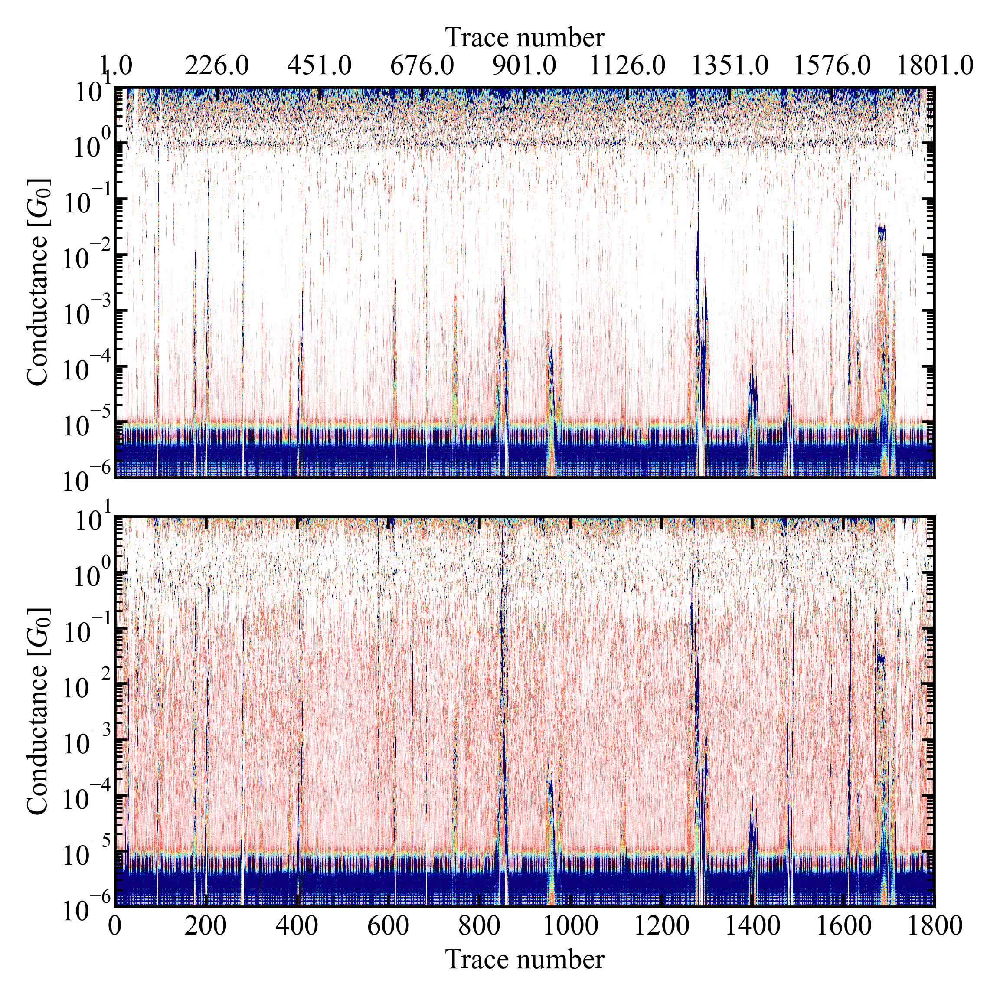

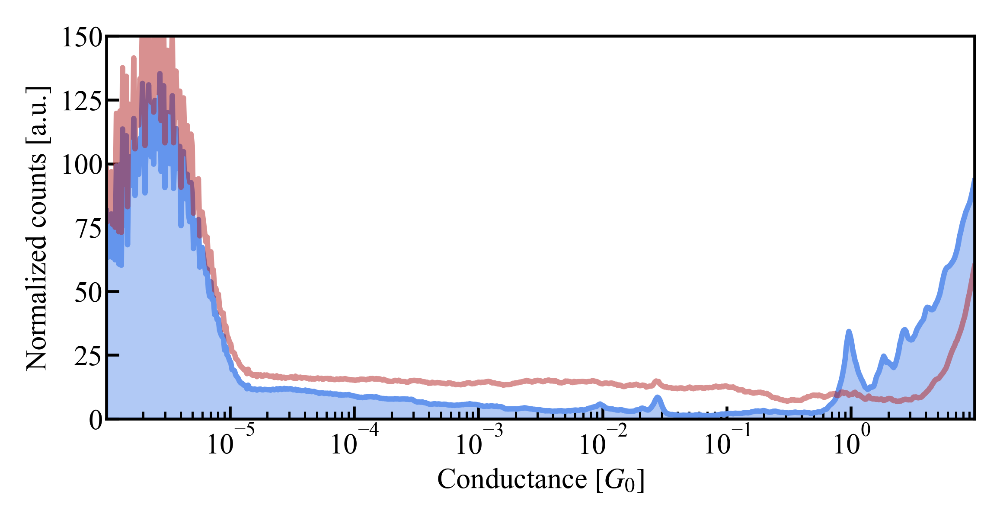

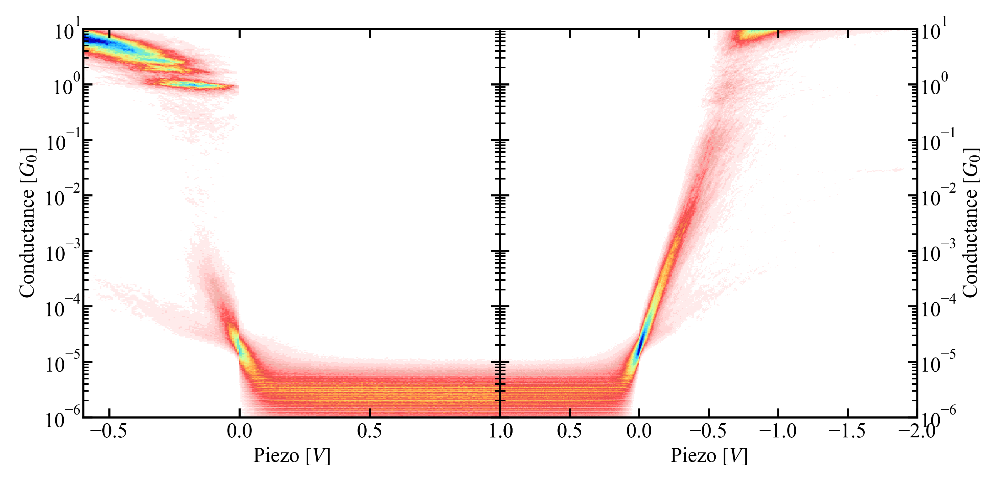

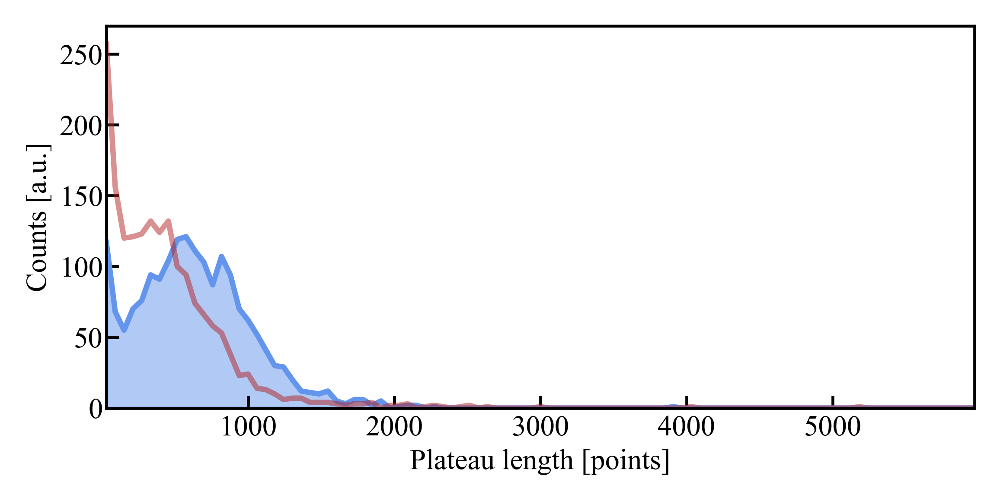

In [37]:
ax_temp_pull, ax_temp_push = hist_1.plot_temporal_hist(vmax=100)
ax_temp_pull.set_xticks(np.linspace(start=0, stop=hist_1.temporal_hist_pull.shape[0], num=9, endpoint=True))
ax_temp_pull.set_xticklabels(np.linspace(start=1, stop=hist_1.temporal_hist_pull.shape[0]+1, num=9, endpoint=True))
ax_1d = hist_1.plot_hist_1d(ylims=(0, 150))
ax_pull, ax_push = hist_1.plot_hist_2d_both()
ax_plat = hist_1.plot_plateau_length_hist()

In [38]:
hist_1.calc_hist_2d(align_at=0.5, range_pull=(-0.5, 1), range_push=(-0.5, 1.5),
                    xbins_pull=200, xbins_push=250)

Calculating 2D conductance-displacement histograms:   0%|          | 0/19 [00:00<?, ?it/s]

2D histogram pull direction created from 1793 traces
2D histogram push direction created from 1799 traces


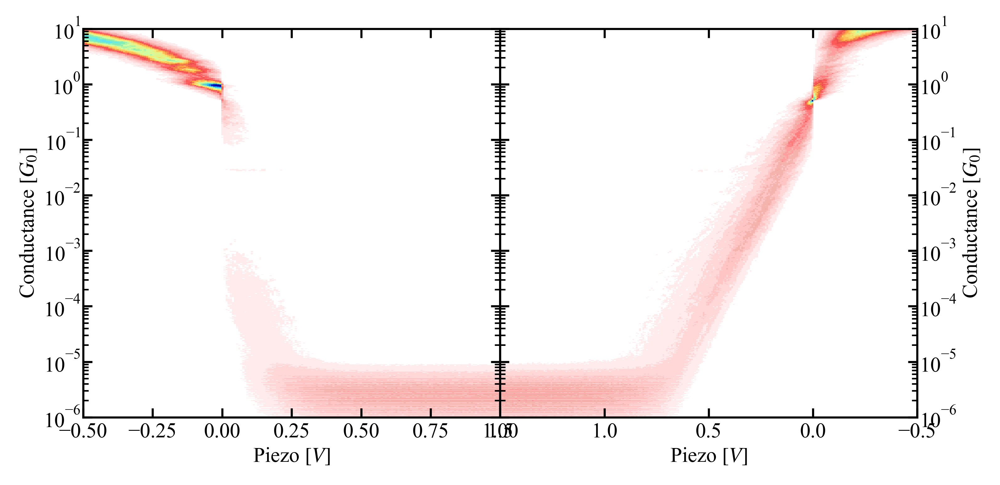

In [39]:
ax_pull, ax_push = hist_1.plot_hist_2d_both()

# Statistics for traces 4480-6700

**BJ Settings:**

|                   |           |
|-------------------|:-----------:|
| rate              |  $8$        |
| pull excursion    | $2$         |
| push excursion    | $2$         |
| $G_{\text{low}}$  | $10^{-5}$ |
| $G_{\text{high}}$ | $10$      |

**1D histograms**: 100 bins per decade

**2D histograms**: 250 bins along horizontal and 400 bins along vertical axis, aligned at $10^{-5}\;G_0$ first and then also at $0.5\;G_0$

In [32]:
hist_2 = Histogram(home_folder, 4480, 6700)

hist_2.calc_stats(align_at=1e-5, range_pull=(-0.6, 1), range_push=(-2, 1), xbins_pull=250, xbins_push=400,
                  plateau_length_bins=100)

Processing break junction files:   0%|          | 0/24 [00:00<?, ?it/s]

Pull 2D histogram created from 2220 traces
Push 2D histogram created from 2219 traces


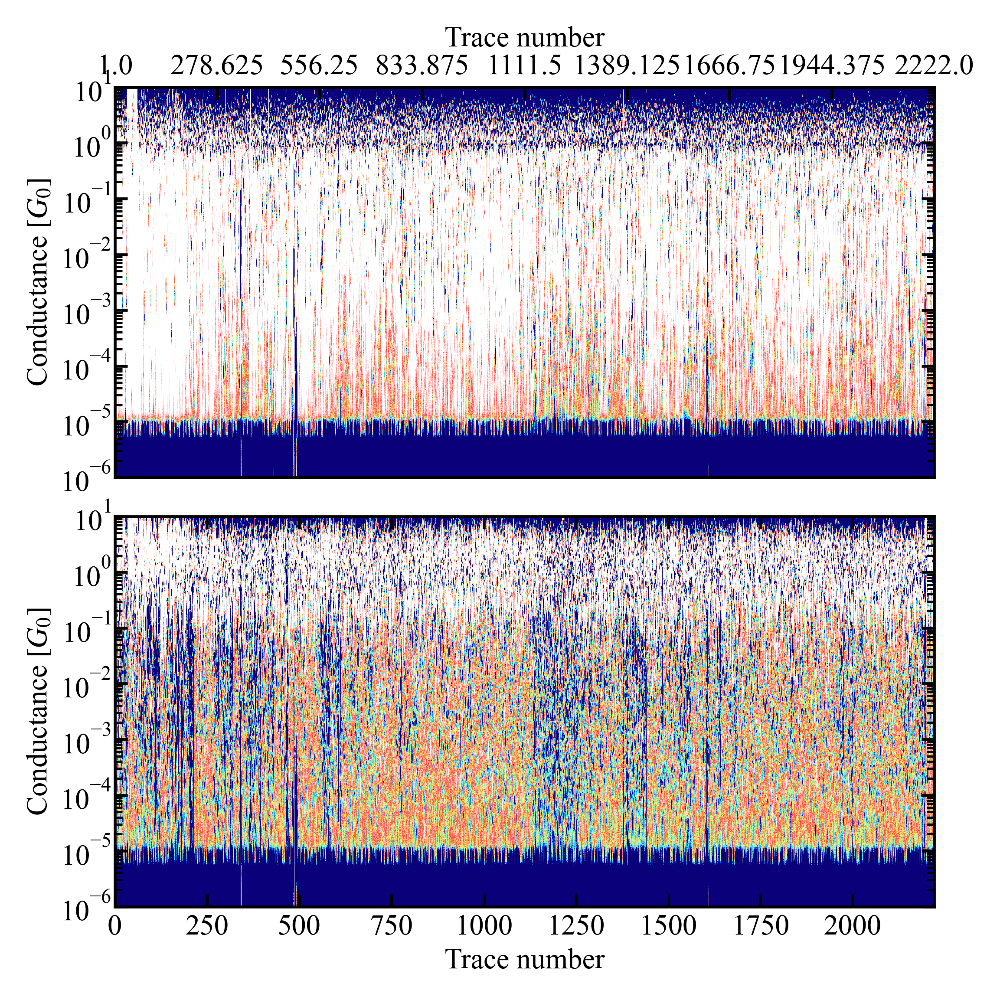

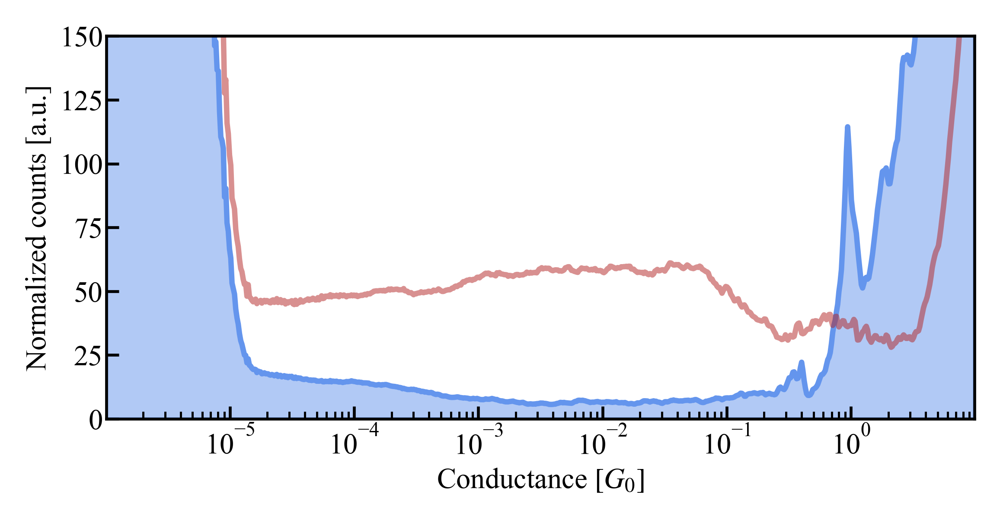

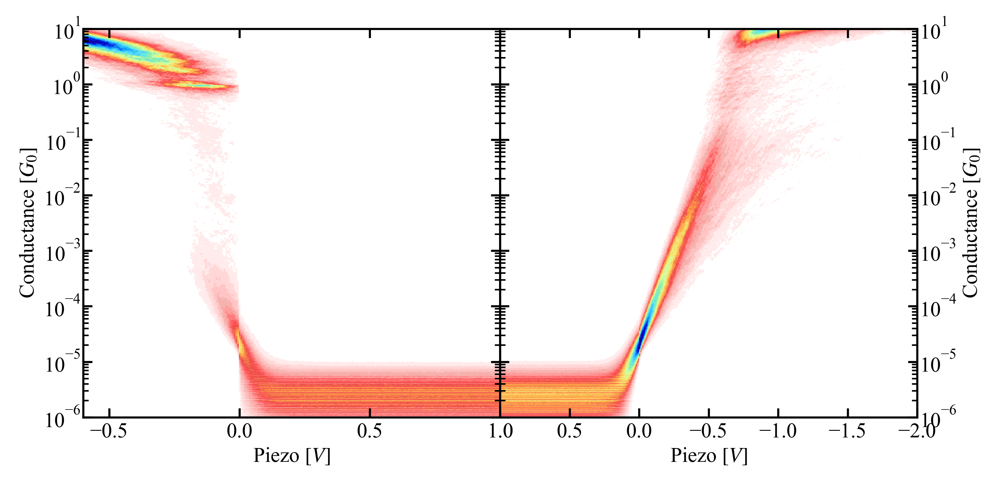

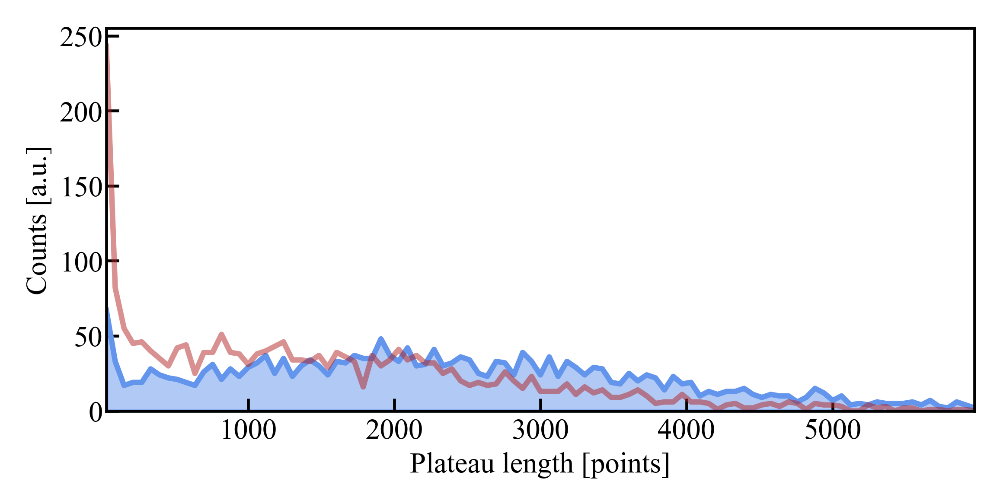

In [33]:
ax_temp_pull, ax_temp_push = hist_2.plot_temporal_hist(vmax=100)
ax_temp_pull.set_xticks(np.linspace(start=0, stop=hist_2.temporal_hist_pull.shape[0], num=9, endpoint=True))
ax_temp_pull.set_xticklabels(np.linspace(start=1, stop=hist_2.temporal_hist_pull.shape[0]+1, num=9, endpoint=True))
ax_1d = hist_2.plot_hist_1d(ylims=(0, 150))
ax_pull, ax_push = hist_2.plot_hist_2d_both()
ax_plat = hist_2.plot_plateau_length_hist()

In [34]:
hist_2.calc_hist_2d(align_at=0.5, range_pull=(-0.5, 1), range_push=(-0.5, 1.5),
                    xbins_pull=200, xbins_push=250)

Calculating 2D conductance-displacement histograms:   0%|          | 0/24 [00:00<?, ?it/s]

2D histogram pull direction created from 2216 traces
2D histogram push direction created from 2221 traces


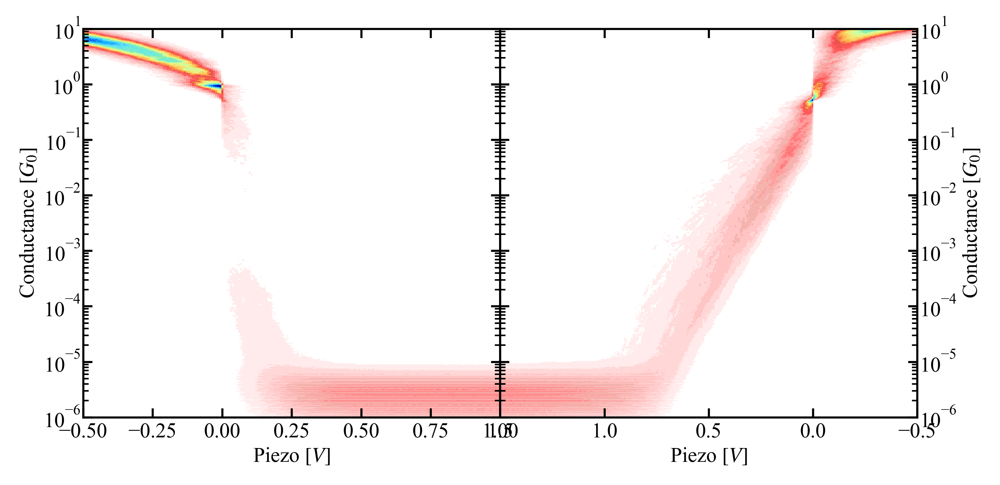

In [35]:
ax_pull, ax_push = hist_2.plot_hist_2d_both()

# I(V) measurements

## Details

**bias waveform**: *custom_IV_mcbj_with_wait.ini*

**bias offset**: 0.0013 V

**IV bias range**: $\pm 1\;\text{V}$

added 500 ms long 100 mV wait in the beginning to account for relaxation

Plotted trace: 34337
1.6046356801927364
0.6554791725693789


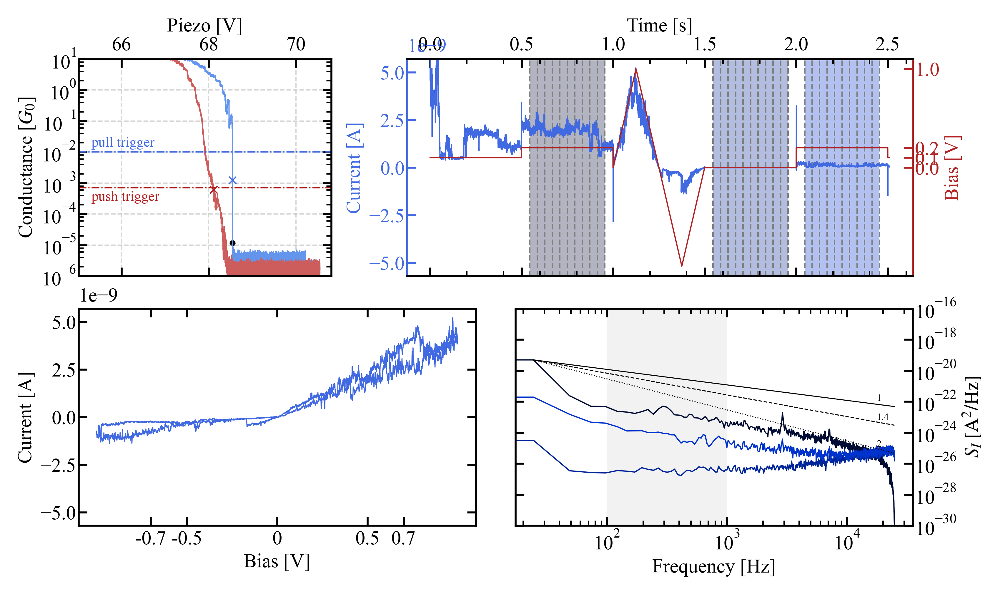

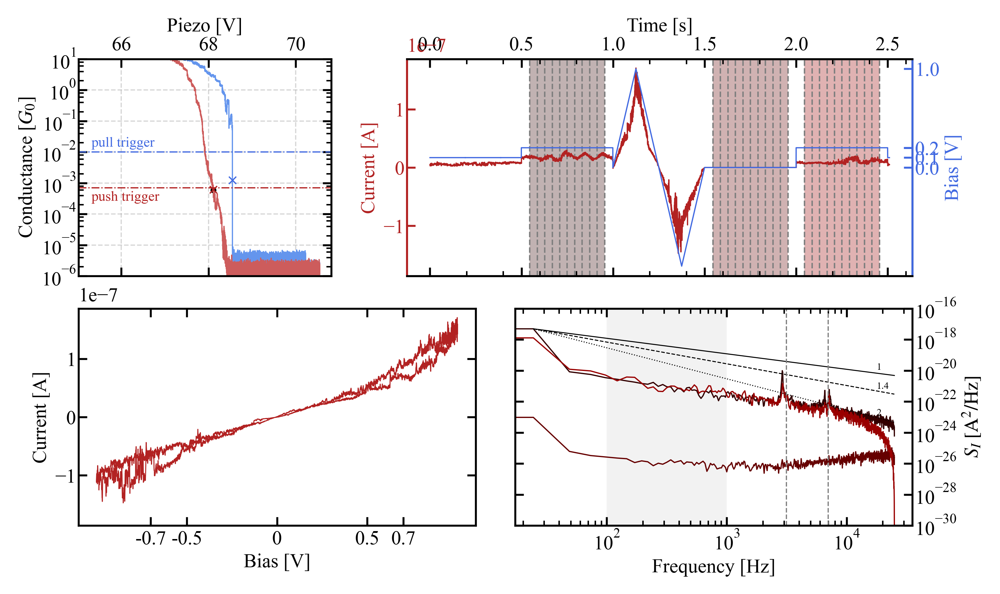

In [19]:
# which_trace = np.random.choice(selected_traces)
which_trace = 34337  # 10950
print(f'Plotted trace: {which_trace}')

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=99_900, min_step_len=20_000, min_height=None, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=10, subtract_bg=False)

ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='pull', which_psds=[1, 2, 3],
                         smoothing=10)

ax_trace.scatter(trace_pair.piezo_pull[trace_pair.hold_index_pull + 1],
                 trace_pair.conductance_pull[trace_pair.hold_index_pull + 1], marker='o', c='k', s=2)

ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push', which_psds=[1, 2, 3],
                         smoothing=10)

ax_trace.scatter(trace_pair.piezo_push[trace_pair.hold_index_push + 1],
                 trace_pair.conductance_push[trace_pair.hold_index_push + 1], marker='o', c='k', s=2)

# plots.plot_measurement_scheme(trace_pair=trace_pair, hold_trace=hold_trace, home_folder=home_folder, smoothing=10)

ax_psd.axvline(3150, c='grey', ls='--', lw=0.5)
ax_psd.axvline(7000, c='grey', ls='--', lw=0.5)

print(filter_traces.iv_difference(hold_trace, direction='pull', smoothing=100))
print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

### Filtering traces that did not break during the hold measurement

In [43]:
did_not_break_pull, did_not_break_push = filter_traces.filter_hold(home_folder,
                                                                   filter_condition=filter_traces.does_not_break_array,
                                                                   start_trace=6701, end_trace=35900,
                                                                   bias_offset=0, r_serial_ohm=99_900,
                                                                   min_step_len=20_000, iv=1)

Filtering traces:   0%|          | 0/293 [00:00<?, ?it/s]

In [44]:
print('pull', len(did_not_break_pull))
print('push', len(did_not_break_push))

pull 9898
push 25999


### Filtering traces where the conductance on the two 200 mV bias plateaus do not differ more than a factor of 2

In [45]:
stable_pull, stable_push = filter_traces.filter_hold(home_folder, filter_condition=filter_traces.conductances_close,
                                                     start_trace=6701, end_trace=34800,
                                                     bias_offset=0.001, r_serial_ohm=99_900,
                                                     min_step_len=20_000, iv=1,
                                                     max_ratio=2, plateaus=(1, 3))

Filtering traces:   0%|          | 0/282 [00:00<?, ?it/s]

In [46]:
print('pull', len(stable_pull))
print('push', len(stable_push))

pull 11949
push 24192


In [47]:
pull_traces = np.intersect1d(did_not_break_pull, stable_pull)
push_traces = np.intersect1d(did_not_break_push, stable_push)

In [48]:
print(f'pull: {len(pull_traces)}, {len(pull_traces)/28100*100}%')
print(f'push: {len(push_traces)}, {len(push_traces)/28100*100}%')

pull: 6183, 22.00355871886121%
push: 23923, 85.13523131672598%


In [49]:
print(f'both: {len(np.intersect1d(pull_traces, push_traces))}, {len(np.intersect1d(pull_traces, push_traces))/28100*100}%')

both: 5726, 20.377224199288257%


In [24]:
push_diff = []
traces = []
for which_trace in tqdm(push_traces):
    try:
        hold_trace = HoldTrace(which_trace, load_from=home_folder, bias_offset=0.001,
                               r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=1)
        push_diff.append(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))
        traces.append(hold_trace.trace_num)
    except MeasurementOverflow:
        continue
    
push_diff = np.array(push_diff)
traces = np.array(traces)

  0%|          | 0/23923 [00:00<?, ?it/s]

6147 25.69493792584542


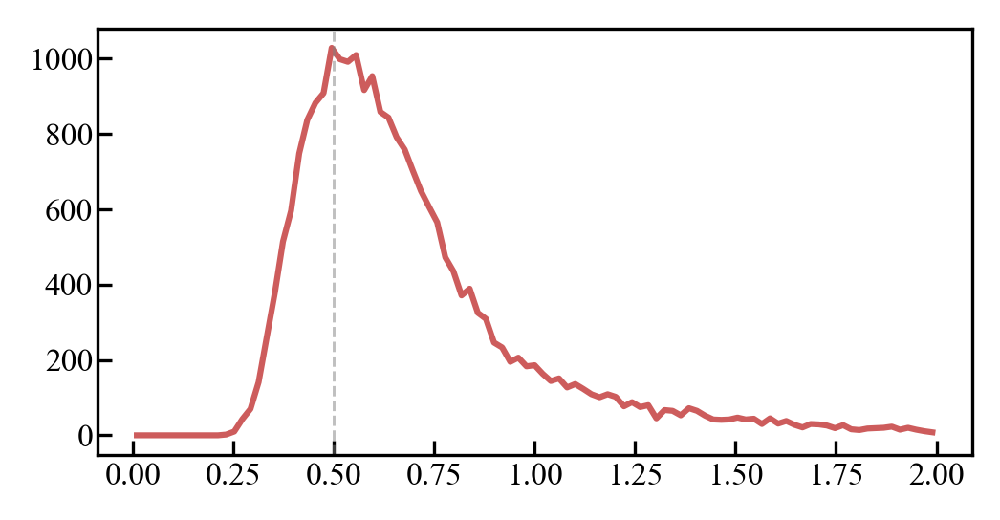

In [25]:
push_diff_bins, push_diff_hist = utils.calc_hist_1d_single(data=push_diff, xrange=(0, 2),
                                                           xbins_num=100, log_scale=False)

print(len(push_diff[push_diff < 0.5]), len(push_diff[push_diff < 0.5])/len(push_diff)*100)

fig, ax = plt.subplots(1, figsize=utils.cm2inch(10, 5), dpi=300)
ax.plot(push_diff_bins, push_diff_hist, 'indianred')
ax.axvline(0.5, c='grey', alpha=0.5, ls='--', lw=0.7)

In [32]:
selected_traces = traces[push_diff < 0.5]
np.save(home_folder.joinpath('results/selected_traces.npy'), selected_traces)
print(f'Number of selected traces: {len(selected_traces)}, {len(selected_traces)/28100*100}%')

Number of selected traces: 6147, 21.875444839857654%


In [20]:
selected_traces = np.load(home_folder.joinpath('results/selected_traces.npy'))

Plotted trace: 23222
1.1359041295139933
0.4174181926303967


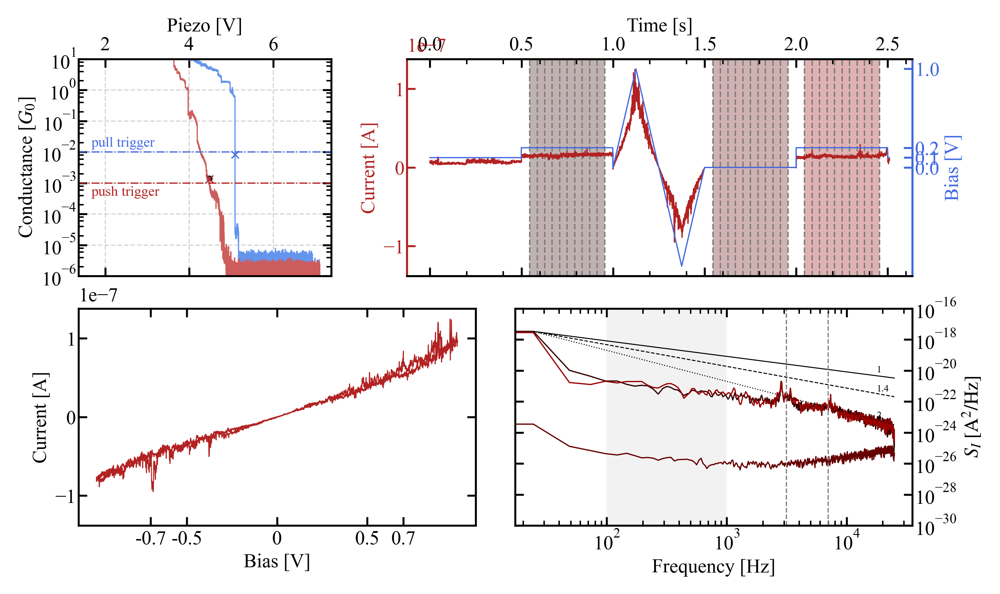

In [23]:
which_trace = np.random.choice(selected_traces)
# which_trace=10930  # 10950
print(f'Plotted trace: {which_trace}')

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=99_900, min_step_len=20_000, min_height=None, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=10, subtract_bg=False)

# ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='pull', which_psds=[1, 2, 3],
#                          smoothing=10)

# ax_trace.scatter(trace_pair.piezo_pull[trace_pair.hold_index_pull + 1],
#                  trace_pair.conductance_pull[trace_pair.hold_index_pull + 1], marker='o', c='k', s=2)

ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push', which_psds=[1, 2, 3],
                         smoothing=10)

ax_trace.scatter(trace_pair.piezo_push[trace_pair.hold_index_push + 1],
                 trace_pair.conductance_push[trace_pair.hold_index_push + 1], marker='o', c='k', s=2)

ax_psd.axvline(3150, c='grey', ls='--', lw=0.5)
ax_psd.axvline(7000, c='grey', ls='--', lw=0.5)

print(filter_traces.iv_difference(hold_trace, direction='pull', smoothing=100))
print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

In [26]:
# noise_stat = NoiseStats(home_folder, traces=selected_traces, num_of_fft=10, bias_offset=0,
#                         min_step_len=20_000, min_height=1, iv=1, subtract_bg=True, save_data=1)

Processing hold files:   0%|          | 0/281 [00:00<?, ?it/s]

Data saved.


In [27]:
noise_stat_push = pd.read_csv(home_folder.joinpath("results/noise_stats_push_1.csv"), skiprows=[1])

In [28]:
step=2

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist
D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist


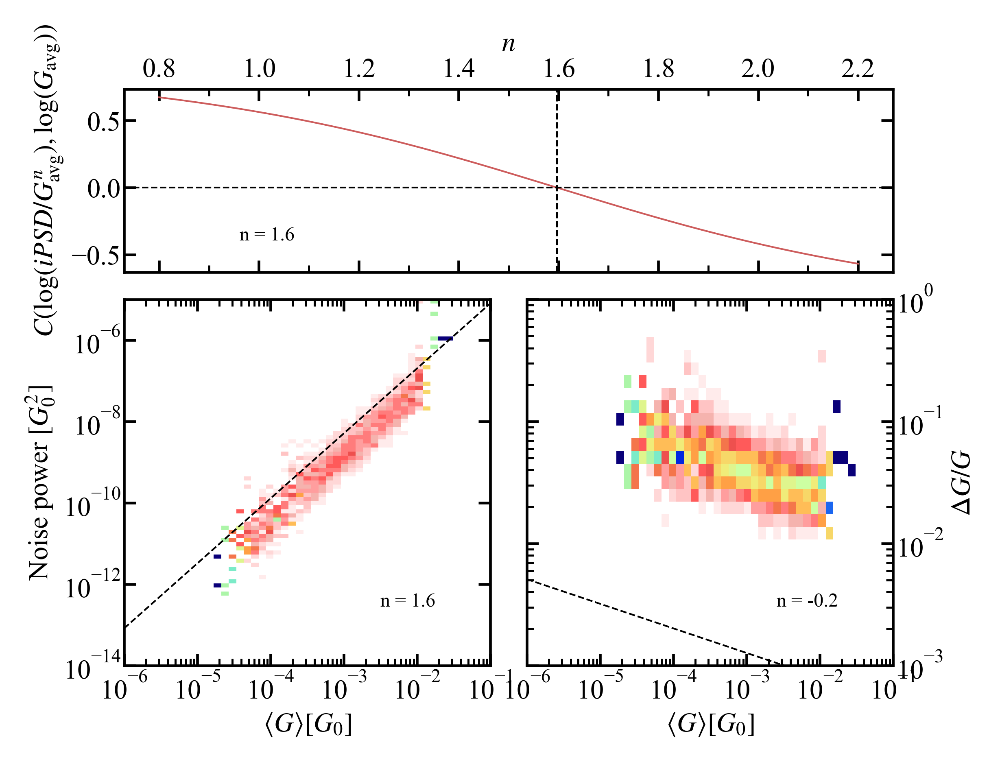

In [29]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

In [40]:
step=3

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist
D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist


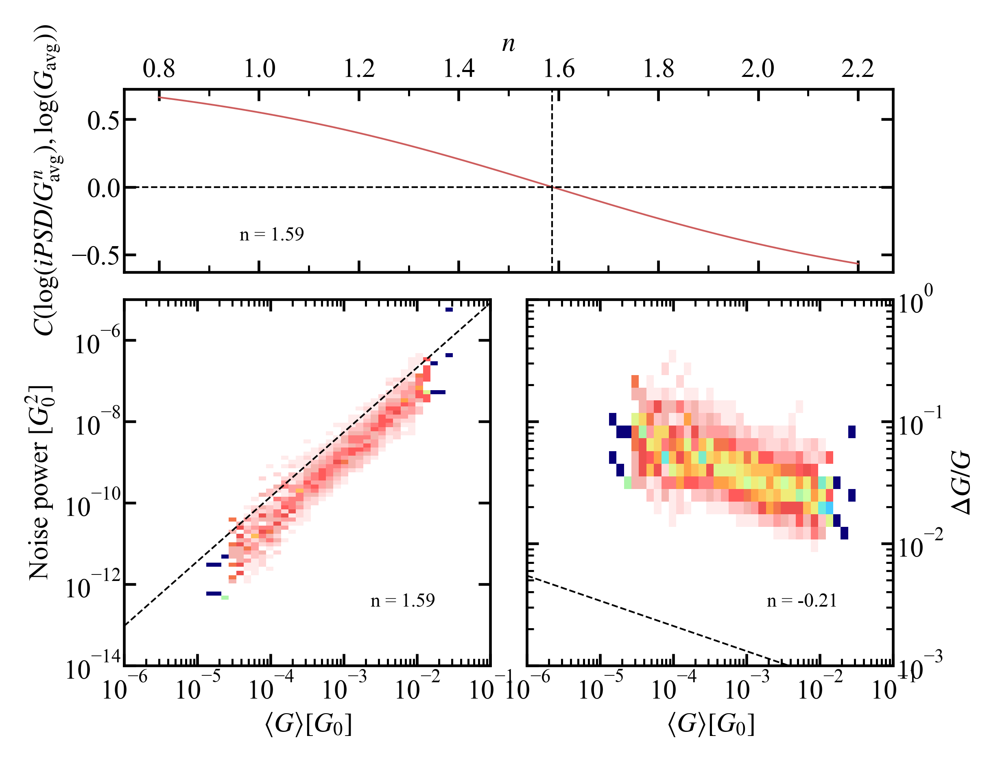

In [41]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

In [50]:
# noise_stat = NoiseStats(home_folder, traces=push_traces, num_of_fft=10, bias_offset=0,
#                         min_step_len=20_000, min_height=1, iv=1, subtract_bg=True, save_data=2)

Processing hold files:   0%|          | 0/282 [00:00<?, ?it/s]

D:\Greta\mcbj_stm-bj\mcbj.py:2819: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(multiplier * areas) / avg_value  # unitless
D:\Greta\mcbj_stm-bj\mcbj.py:2822: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.ones_like(multiplier) * areas) / avg_value  # unitless \Delta I/ I


Data saved.


In [51]:
noise_stat_push = pd.read_csv(home_folder.joinpath("results/noise_stats_push_2.csv"), skiprows=[1])

In [52]:
step=2

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist
D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist


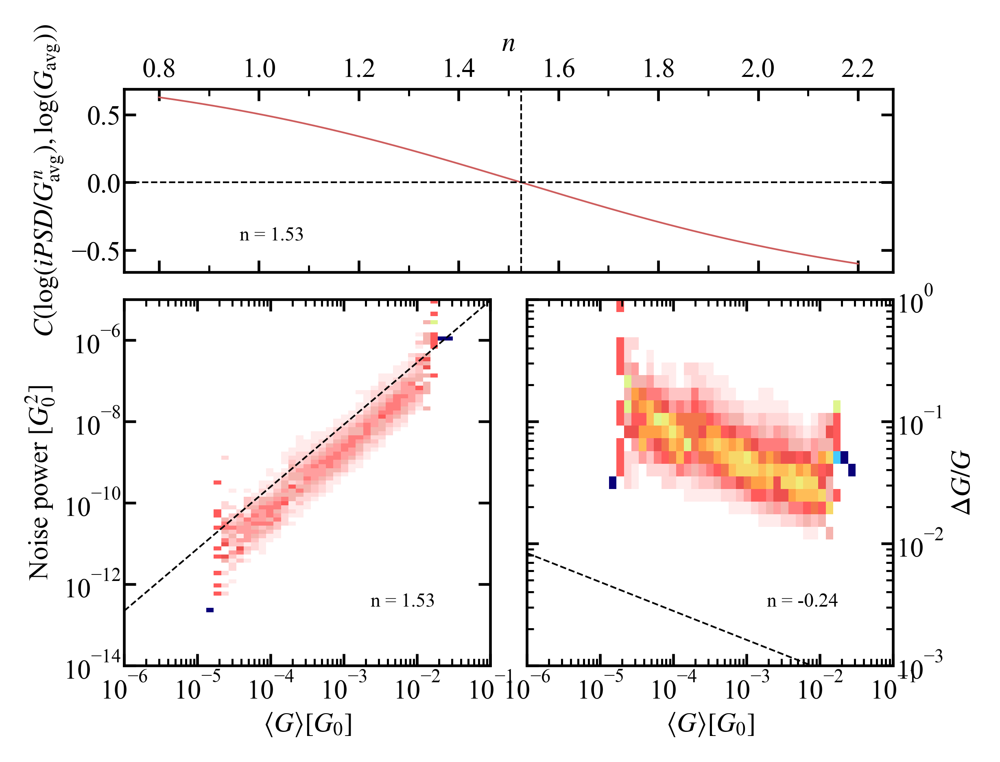

In [53]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

In [54]:
step=3

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist
D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist


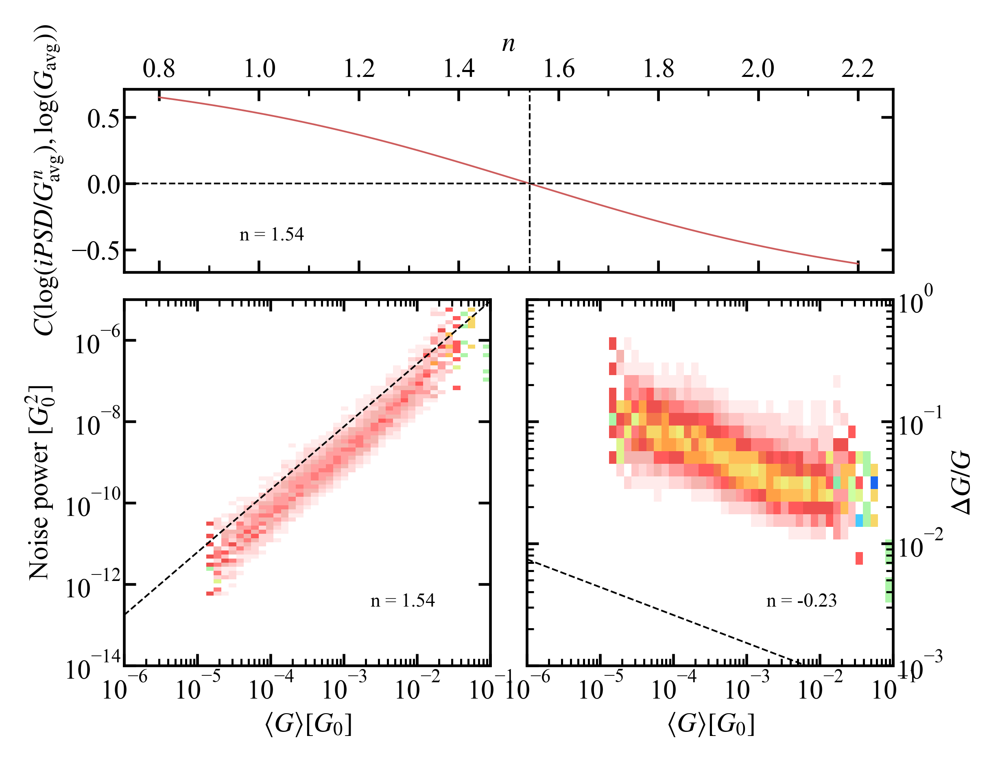

In [55]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

# Measurements with the piezo filter (37901-42500)

### Filtering traces that did not break during the hold measurement

In [56]:
did_not_break_pull, did_not_break_push = filter_traces.filter_hold(home_folder,
                                                                   filter_condition=filter_traces.does_not_break_array,
                                                                   start_trace=37901, end_trace=42500,
                                                                   bias_offset=0, r_serial_ohm=99_900,
                                                                   min_step_len=20_000, iv=1)

Filtering traces:   0%|          | 0/47 [00:00<?, ?it/s]

In [57]:
print('pull', len(did_not_break_pull))
print('push', len(did_not_break_push))

pull 784
push 3251


### Filtering traces where the conductance on the two 200 mV bias plateaus do not differ more than a factor of 2

In [58]:
stable_pull, stable_push = filter_traces.filter_hold(home_folder, filter_condition=filter_traces.conductances_close,
                                                     start_trace=37901, end_trace=42500,
                                                     bias_offset=0.001, r_serial_ohm=99_900,
                                                     min_step_len=20_000, iv=1,
                                                     max_ratio=2, plateaus=(1, 3))

Filtering traces:   0%|          | 0/47 [00:00<?, ?it/s]

In [59]:
print('pull', len(stable_pull))
print('push', len(stable_push))

pull 1227
push 3144


In [60]:
pull_traces = np.intersect1d(did_not_break_pull, stable_pull)
push_traces = np.intersect1d(did_not_break_push, stable_push)

In [61]:
print(f'pull: {len(pull_traces)}, {len(pull_traces)/28100*100}%')
print(f'push: {len(push_traces)}, {len(push_traces)/28100*100}%')

pull: 537, 1.9110320284697508%
push: 3144, 11.188612099644129%


In [62]:
print(f'both: {len(np.intersect1d(pull_traces, push_traces))}, {len(np.intersect1d(pull_traces, push_traces))/28100*100}%')

both: 517, 1.8398576512455516%


In [91]:
pull_diff = []
traces_pull = []
for which_trace in tqdm(push_traces):
    try:
        hold_trace = HoldTrace(which_trace, load_from=home_folder, bias_offset=0.001,
                               r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=1)
        pull_diff.append(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))
        traces_pull.append(hold_trace.trace_num)
    except MeasurementOverflow:
        continue
    
push_diff = np.array(push_diff)
traces_pull = np.array(traces_pull)

  0%|          | 0/3144 [00:00<?, ?it/s]

In [63]:
push_diff = []
traces_push = []
for which_trace in tqdm(push_traces):
    try:
        hold_trace = HoldTrace(which_trace, load_from=home_folder, bias_offset=0.001,
                               r_serial_ohm=99_900, min_step_len=20_000, min_height=1, iv=1)
        push_diff.append(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))
        traces_push.append(hold_trace.trace_num)
    except MeasurementOverflow:
        continue
    
push_diff = np.array(push_diff)
traces_push = np.array(traces_push)

  0%|          | 0/3144 [00:00<?, ?it/s]

923 29.357506361323153


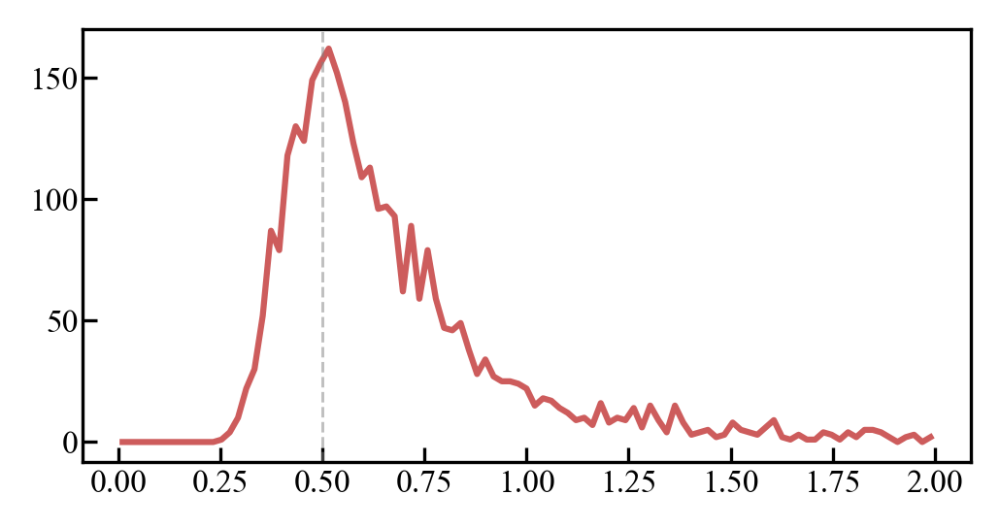

In [64]:
push_diff_bins, push_diff_hist = utils.calc_hist_1d_single(data=push_diff, xrange=(0, 2),
                                                           xbins_num=100, log_scale=False)

print(len(push_diff[push_diff < 0.5]), len(push_diff[push_diff < 0.5])/len(push_diff)*100)

fig, ax = plt.subplots(1, figsize=utils.cm2inch(10, 5), dpi=300)
ax.plot(push_diff_bins, push_diff_hist, 'indianred')
ax.axvline(0.5, c='grey', alpha=0.5, ls='--', lw=0.7)

In [69]:
selected_traces_2 = traces_push[push_diff < 0.5]
np.save(home_folder.joinpath('results/selected_traces_2.npy'), selected_traces_2)
print(f'Number of selected traces: {len(selected_traces_2)}, {len(selected_traces_2)/28100*100}%')

Number of selected traces: 923, 3.284697508896797%


In [70]:
selected_traces_2 = np.load(home_folder.joinpath('results/selected_traces_2.npy'))

Plotted trace: 42775
0.5978363334009555
0.511822289230496


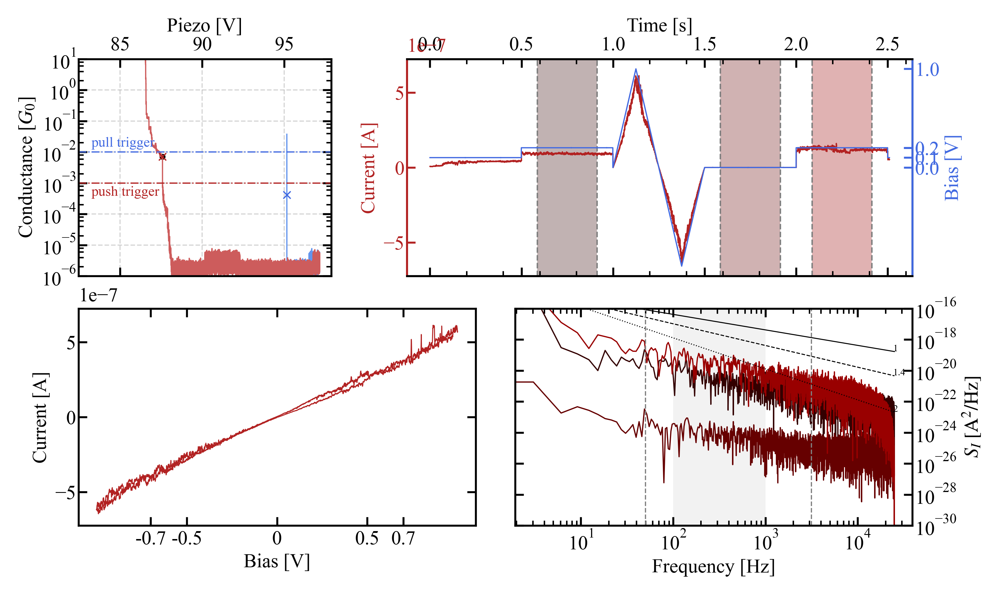

In [95]:
# which_trace = np.random.choice(selected_traces_2)
which_trace=42775  # 10950
print(f'Plotted trace: {which_trace}')

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=99_900, min_step_len=20_000, min_height=None, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=1, subtract_bg=False)

# ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='pull', which_psds=[1, 2, 3],
#                          smoothing=10)

# ax_trace.scatter(trace_pair.piezo_pull[trace_pair.hold_index_pull + 1],
#                  trace_pair.conductance_pull[trace_pair.hold_index_pull + 1], marker='o', c='k', s=2)

ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push', which_psds=[1, 2, 3],
                         smoothing=10)

ax_trace.scatter(trace_pair.piezo_push[trace_pair.hold_index_push + 1],
                 trace_pair.conductance_push[trace_pair.hold_index_push + 1], marker='o', c='k', s=2)

ax_psd.axvline(3150, c='grey', ls='--', lw=0.5)
ax_psd.axvline(50, c='grey', ls='--', lw=0.5)

print(filter_traces.iv_difference(hold_trace, direction='pull', smoothing=100))
print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

Plotted trace: 38913
0.6245256464016977
0.48750658111491385


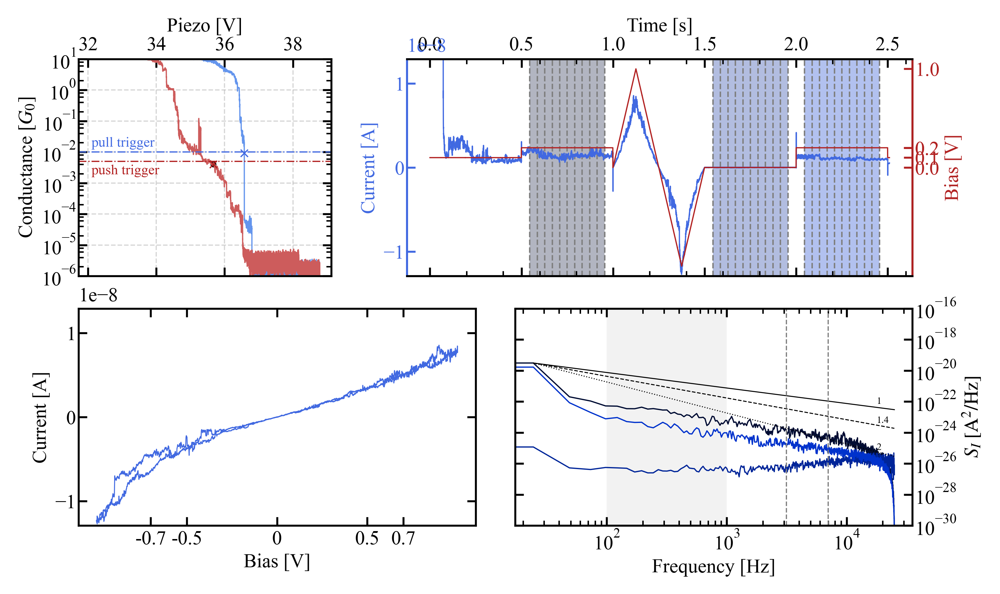

In [89]:
which_trace = np.random.choice(pull_traces)
# which_trace=10930  # 10950
print(f'Plotted trace: {which_trace}')

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=99_900, min_step_len=20_000, min_height=None, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=10, subtract_bg=False)

# ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='pull', which_psds=[1, 2, 3],
#                          smoothing=10)

# ax_trace.scatter(trace_pair.piezo_pull[trace_pair.hold_index_pull + 1],
#                  trace_pair.conductance_pull[trace_pair.hold_index_pull + 1], marker='o', c='k', s=2)

ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='pull', which_psds=[1, 2, 3],
                         smoothing=10)

ax_trace.scatter(trace_pair.piezo_push[trace_pair.hold_index_push + 1],
                 trace_pair.conductance_push[trace_pair.hold_index_push + 1], marker='o', c='k', s=2)

ax_psd.axvline(3150, c='grey', ls='--', lw=0.5)
ax_psd.axvline(7000, c='grey', ls='--', lw=0.5)

print(filter_traces.iv_difference(hold_trace, direction='pull', smoothing=100))
print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

In [75]:
noise_stat = NoiseStats(home_folder, traces=selected_traces, num_of_fft=10, bias_offset=0,
                        min_step_len=20_000, min_height=1, iv=1, subtract_bg=True, save_data=3)

Processing hold files:   0%|          | 0/281 [00:00<?, ?it/s]

D:\Greta\mcbj_stm-bj\mcbj.py:2819: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(multiplier * areas) / avg_value  # unitless
D:\Greta\mcbj_stm-bj\mcbj.py:2822: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.ones_like(multiplier) * areas) / avg_value  # unitless \Delta I/ I


Data saved.


In [76]:
noise_stat_push = pd.read_csv(home_folder.joinpath("results/noise_stats_push_3.csv"), skiprows=[1])

In [77]:
step=2

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist
D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist


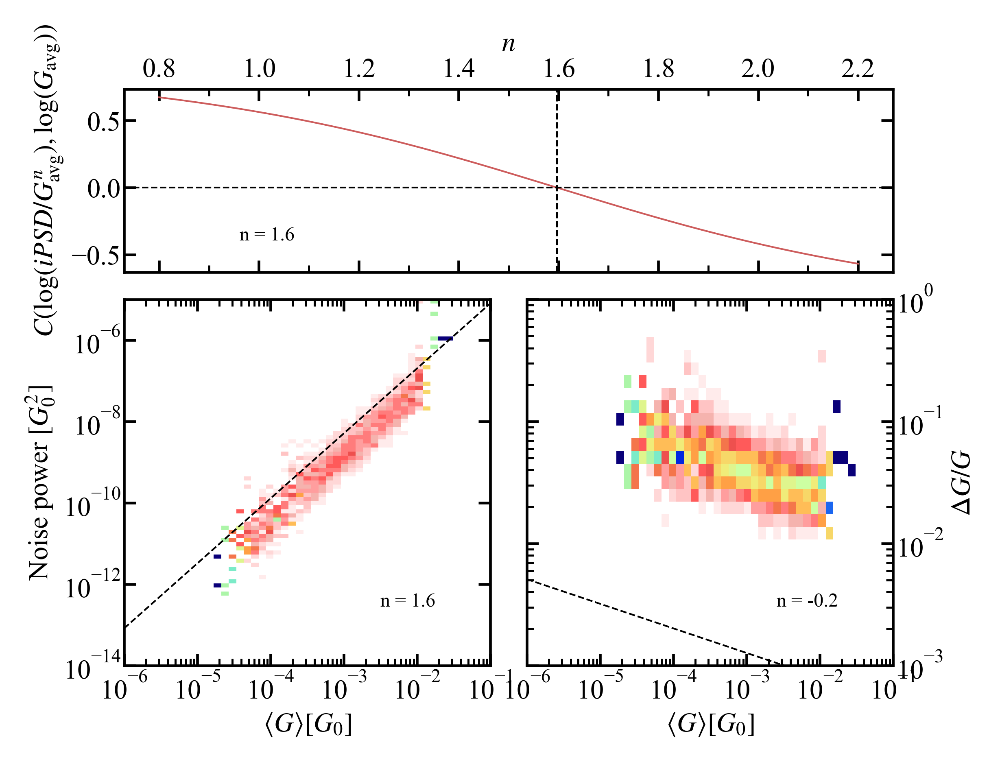

In [78]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

In [79]:
step=3

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist
D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist


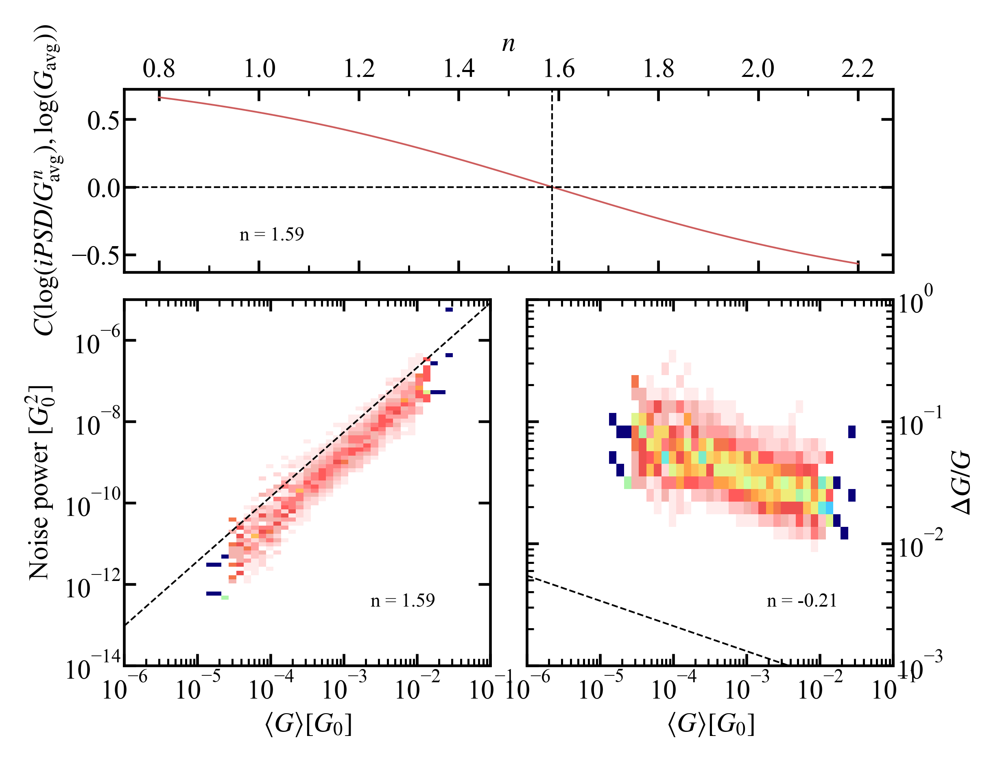

In [80]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

In [81]:
noise_stat = NoiseStats(home_folder, traces=push_traces, num_of_fft=10, bias_offset=0,
                        min_step_len=20_000, min_height=1, iv=1, subtract_bg=True, save_data=4)

Processing hold files:   0%|          | 0/47 [00:00<?, ?it/s]

D:\Greta\mcbj_stm-bj\mcbj.py:2819: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(multiplier * areas) / avg_value  # unitless
D:\Greta\mcbj_stm-bj\mcbj.py:2822: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.ones_like(multiplier) * areas) / avg_value  # unitless \Delta I/ I


Data saved.


In [82]:
noise_stat_push = pd.read_csv(home_folder.joinpath("results/noise_stats_push_4.csv"), skiprows=[1])

In [83]:
step=2

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist
D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist


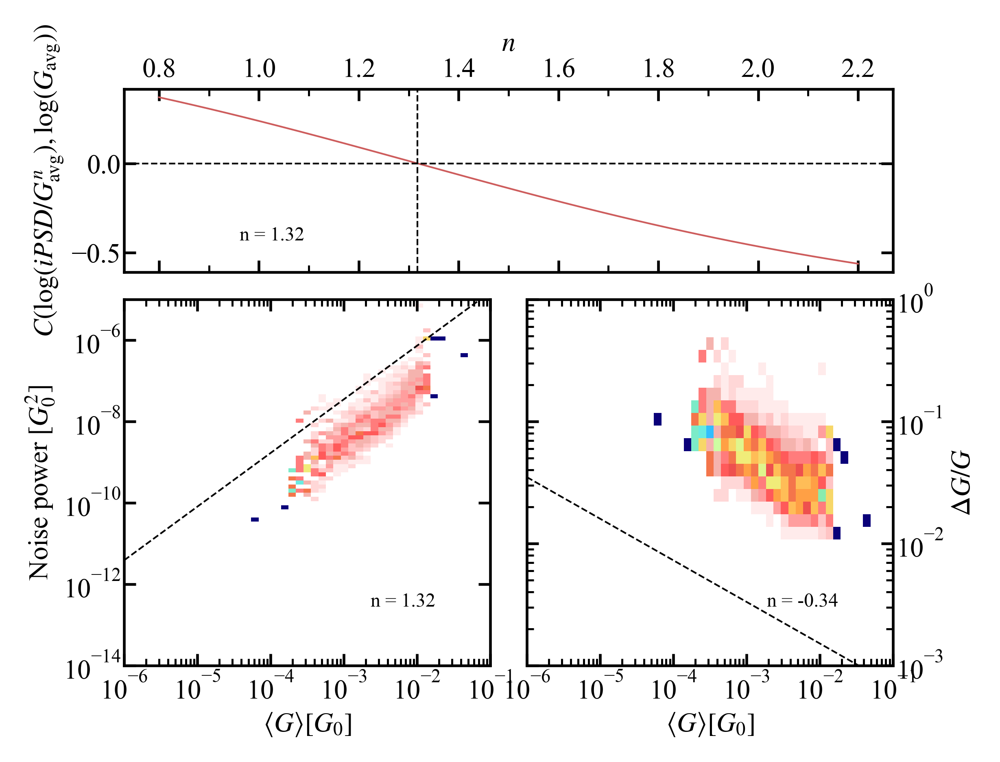

In [84]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)

In [85]:
step=3

N = np.linspace(0.8, 2.2, num=1000)
pull_corr = np.zeros_like(N)
push_corr = np.zeros_like(N)
for i, n in enumerate(N):
    push_corr[i] = utils.calc_correlation(np.log10(noise_stat_push[f'noise_power_{step}']/ \
                                                   noise_stat_push[f'avg_cond_on_step_{step}']**n),
                                          np.log10(noise_stat_push[f'avg_cond_on_step_{step}']))

D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist
D:\Greta\mcbj_stm-bj\plots.py:576: RuntimeWarning: invalid value encountered in true_divide
  h = h / avg_cond_hist


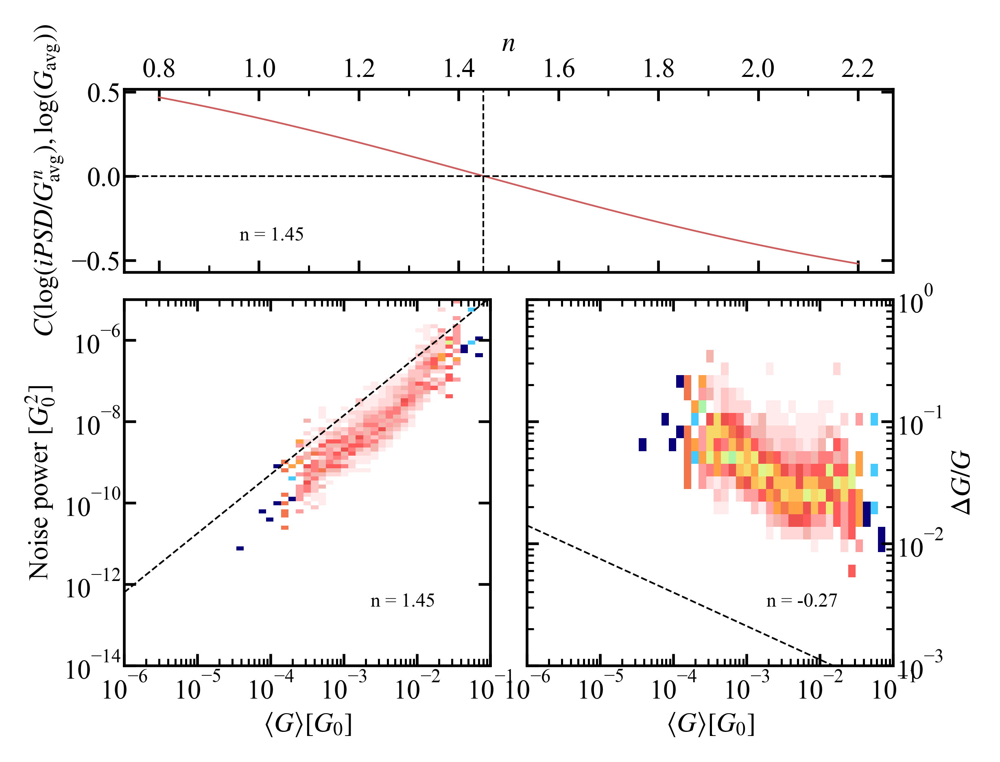

In [86]:
ax_corr, ax_corrhist_1, ax_corrhist_2 = plots.plot_noise_power(N=N, corr=push_corr,
                                                               source=noise_stat_push,
                                                               step=step,
                                                               direction='push', vmax=0.5)